### Sadaf Sadeghian  810195419

# MNIST

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [2]:
trainData = pd.read_csv('./MNIST/train_data.csv', header = None)
trainLabels = pd.read_csv('./MNIST/train_label.csv', header = None, names = ['label'])
testData = pd.read_csv('./MNIST/test_data.csv', header = None)
testLabels = pd.read_csv('./MNIST/test_label.csv', header = None, names = ['label'])

## Visualization

In [3]:
def visualize(digit):
    image = np.array(digit, dtype='float')
    pixels = image.reshape((28, 28))
    plt.imshow(pixels, cmap='gray')
    plt.show()

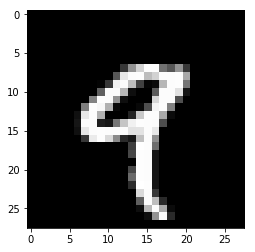

In [4]:
digitNine = trainData.loc[trainLabels['label']==9]
nineDigit =digitNine.iloc[0]
visualize(nineDigit)

## K-Nearest Neighbors 

<b>1.</b> <br>
K-Nearest Neighbours is a classification algorithms in Machine Learning which belongs to the supervised learning domain.
KNN algorithm is based on the assumption that similar data points are close to each other.
Given an unclassified point, we can assign it to a group by observing what group its nearest neighbours belong to; So a proper function should be used based on the problem for calculating the distance between points on the feature space to find nearest neighbours.

<b> 2. </b> <br>

In [5]:
from sklearn.neighbors import KNeighborsClassifier

In [6]:
for i in range(1, 7):
    neigh = KNeighborsClassifier(n_neighbors = i)
    neigh.fit(trainData.values, trainLabels.values.ravel() )
    print("k =",i, " score =",  neigh.score(testData.values, testLabels.values.ravel()))

k = 1  score = 0.86
k = 2  score = 0.87
k = 3  score = 0.895
k = 4  score = 0.9
k = 5  score = 0.89
k = 6  score = 0.885


Using score function we can observe that by increasing k from 1 to 4, the score increases and after that score decreases as we increase k.<br>
So we will use k = 4

In [7]:
k= 4
neighClf = KNeighborsClassifier(n_neighbors=k)
neighClf.fit(trainData.values, trainLabels.values.ravel())

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=4, p=2,
                     weights='uniform')

Accuracy:  0.9


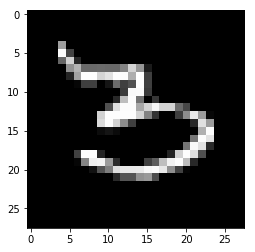

Predicted digit: 2


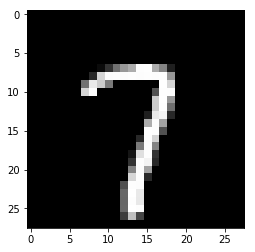

Predicted digit: 7


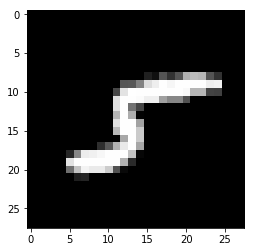

Predicted digit: 5


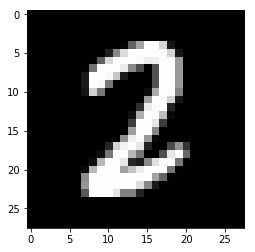

Predicted digit: 2


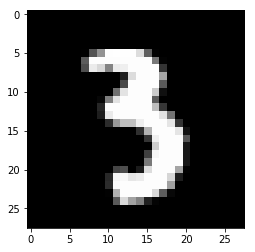

Predicted digit: 3


In [8]:
testNum = 200
pred = neighClf.predict(testData.iloc[0:testNum].values)

correctPred = 0;
for index, predicted in enumerate(pred):
    if predicted == testLabels.values[index]:
        correctPred += 1
print("Accuracy: ", correctPred / testNum)   

for index, digit in enumerate(testData.iloc[0:5].values):
    visualize(digit)
    print("Predicted digit:", pred[index])

<b> 3. </b>

[1.0, 0.988, 0.98, 0.98, 0.97, 0.97]


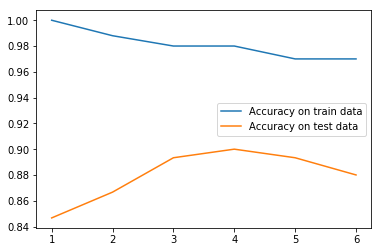

In [9]:
n1 = 150
n2 = 500
testAcc = []
trainAcc = []
kRange = range(1, 7)

for i in kRange:
    neighTest = KNeighborsClassifier(n_neighbors = i)
    neighTest.fit(trainData.values, trainLabels.values.ravel() )
    
    trainAcc.append(neighTest.score(trainData.iloc[0:n2].values, trainLabels.iloc[0:n2].values.ravel()))
    testAcc.append(neighTest.score(testData.iloc[0:n1].values, testLabels.iloc[0:n1].values.ravel()))

print(trainAcc)
plt.plot(kRange, trainAcc)
plt.plot(kRange, testAcc)
plt.legend(['Accuracy on train data', 'Accuracy on test data'], loc='center right')
plt.show()

Accuracy on test data is maximum when k = 4

<b> 4. </b> <br>
Obviously accuracy on train data is maximum in k = 1 as each example will get its own label and by increasing k in accuracy decreases and loss increases as it will match the example with more samples which are not that sample exactly.

<b> 5. </b> <br>

Test example:


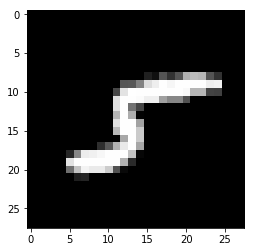

Neighbours: 


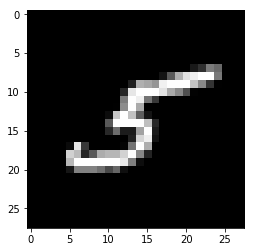

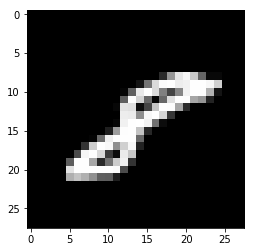

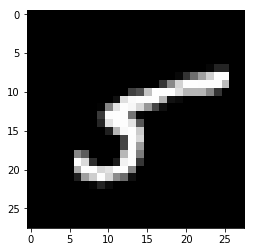

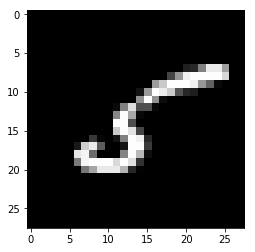

In [10]:
testExampleIndex = 2

print("Test example:")
visualize(testData.iloc[testExampleIndex].values)
thisNeigh = neighClf.kneighbors([testData.iloc[testExampleIndex]])

print("Neighbours: ")
for n in thisNeigh[1][0]:
    visualize(trainData.iloc[n].values)

<b> 6. </b> <br>
- Computationally expensive : We need to compute distance of each example to all training samples. As it is a lazy learning method, it requires that most of computation be done during testing, rather than during training which can be an issue for large datasets and make the algorithm slow.
- Optimal number of neighbors: Choosing the optimal number of neighbors to be consider while classifying the new data entry is one of the issues.
- High memory requirement: All or almost all of the training samples need to be stored in memory.

## Desicion Tree

<b> 7. </b> <br>
Decison trees are a non-parametric supervised learning method used for classification.
A Decision tree is a flowchart like tree structure, where each internal node denotes a test on an attribute, each branch represents an outcome of the test, and each leaf node holds a class label.


<b> 8. </b>

In [11]:
from sklearn.tree import DecisionTreeClassifier

In [12]:
treeClf = DecisionTreeClassifier(max_depth = 16, random_state = 0)
treeClf = treeClf.fit(trainData.values, trainLabels.values.ravel())

Accuracy:  0.725
score 1.0


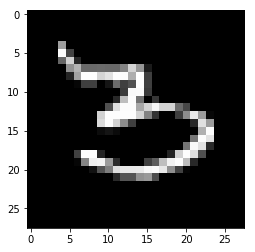

Predicted digit: 3


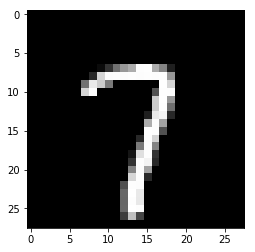

Predicted digit: 7


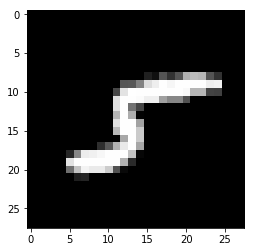

Predicted digit: 5


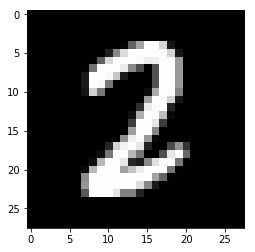

Predicted digit: 2


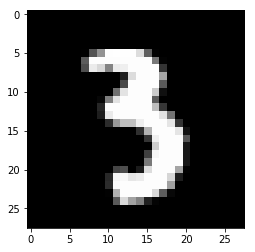

Predicted digit: 9


In [13]:
pred = treeClf.predict(testData.iloc[0:200].values)

correctPred = 0;
for index, predicted in enumerate(pred):
    if predicted == testLabels.values[index]:
        correctPred += 1
print("Accuracy: ", correctPred / testNum) 
print("score", treeClf.score(trainData.values, trainLabels.values.ravel()))

for index, digit in enumerate(testData.iloc[0:5].values):
    visualize(digit)
    print("Predicted digit:", pred[index])

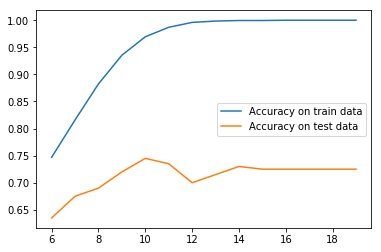

In [14]:
testAccTree = []
trainAccTree = []
maxDepthRange = range(6, 20)

for i in maxDepthRange:
    treeTest = DecisionTreeClassifier(max_depth = i, random_state = 0)
    treeTest.fit(trainData.values, trainLabels.values.ravel())
    
    trainAccTree.append( treeTest.score(trainData.values, trainLabels.values.ravel()))
    testAccTree.append( treeTest.score(testData.values, testLabels.values.ravel()))
    
plt.plot(maxDepthRange, trainAccTree)
plt.plot(maxDepthRange, testAccTree)
plt.legend(['Accuracy on train data', 'Accuracy on test data'], loc='center right')
plt.show()

<b> 10. </b>

In [23]:
from sklearn.tree import export_graphviz
from subprocess import call
import pydotplus
from sklearn.externals.six import StringIO 
from IPython.display import Image 

dot_data = StringIO()
# dot_data = export_graphviz(treeClf, out_file=None, filled=True, rounded=True)

export_graphviz(treeClf, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
#graph.create_png('tree.png')

In [27]:
from IPython.display import Image 
Image(graph.create_png())
# graph.write_png('tree.png')